<a href="https://colab.research.google.com/github/Mau212P/D.C-5DV1-Trabajos/blob/main/ProyectoFinal_XD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Paso 1: Obtención de imágenes de resonancia magnética (MRI)
# Descarga de las imágenes de un repositorio o base de datos

# Importar bibliotecas necesarias
import os
from google.colab import files

# Subir el archivo kaggle.json
files.upload()

# Crear la carpeta .kaggle y mover el archivo kaggle.json allí
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Verificar que el archivo se haya movido correctamente
!ls ~/.kaggle

# Instalar la biblioteca Kaggle
!pip install -q kaggle

# Descargar el conjunto de datos desde Kaggle
!kaggle datasets download -d sartajbhuvaji/brain-tumor-classification-mri

# Descomprimir el archivo descargado
!unzip brain-tumor-classification-mri.zip -d brain_tumor_dataset


Saving kaggle.json to kaggle.json
kaggle.json
Dataset URL: https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri
License(s): MIT
 90% 78.0M/86.8M [00:00<00:00, 163MB/s]
100% 86.8M/86.8M [00:00<00:00, 128MB/s]
Archive:  brain-tumor-classification-mri.zip
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(1).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(10).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(100).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(11).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(12).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(13).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(14).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(15).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(16).jpg  
  inflating: brain_tumor_dataset/Testing/glioma_tumor/image(17).jpg  
  inflating: brain_tumo

In [ ]:
import os
import cv2
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
import tensorflow as tf
from tensorflow.keras import layers, models
import seaborn as sns
import matplotlib.pyplot as plt
import random

# Función para cargar imágenes y etiquetas de un directorio
def load_images_and_labels(data_dir):
    image_paths = []
    labels = []
    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.endswith(".jpg") or file.endswith(".png"):
                image_paths.append(os.path.join(root, file))
                labels.append(os.path.basename(root))  # La etiqueta es el nombre de la carpeta que contiene la imagen
    return image_paths, labels

# Función para cargar bounding boxes (coordenadas del tumor)
def load_bounding_boxes(data_dir):
    bounding_boxes = {}
    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.endswith(".jpg") or file.endswith(".png"):
                img_path = os.path.join(root, file)
                # Anotación de bounding box
                bounding_boxes[img_path] = [(50, 50, 100, 100)]  # (x, y, width, height)
    return bounding_boxes

# Función para preprocesar una imagen
def preprocess_image(image_path, bounding_boxes=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))  # Redimensionar a 224x224
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_normalized = img_gray / 255.0  # Normalizar a [0, 1]

    if bounding_boxes and image_path in bounding_boxes:
        for (x, y, w, h) in bounding_boxes[image_path]:
            # Obtener la etiqueta de la imagen
            label = os.path.basename(os.path.dirname(image_path))
            # Dibujar rectángulo solo si no es "no_tumor"
            if label != "no_tumor":
                cv2.rectangle(img_normalized, (x, y), (x + w, y + h), (1, 0, 0), 2)  # Dibujar rectángulo

    return img_normalized

# Función para cargar y preprocesar todas las imágenes en un directorio
def load_and_preprocess_images(image_paths, bounding_boxes=None):
    images = [preprocess_image(img_path, bounding_boxes) for img_path in image_paths]
    images = np.array(images)
    return images

# Función para mostrar imágenes clasificadas por un método específico
def mostrar_imagenes_clasificadas(images, predicted_labels, true_labels, method_name, num_por_clase=5):
    le = LabelEncoder()
    clases = le.fit_transform(np.unique(true_labels))
    plt.figure(figsize=(20, 10))
    for i, clase in enumerate(clases):
        indices_clase = np.where(true_labels == clase)[0]
        indices_mostrar = np.random.choice(indices_clase, num_por_clase, replace=False)
        for j, indice in enumerate(indices_mostrar):
            plt.subplot(len(clases), num_por_clase, i * num_por_clase + j + 1)
            plt.imshow(images[indice], cmap='gray')
            plt.title(f"Pred: {le.inverse_transform([predicted_labels[indice]])[0]}\nTrue: {le.inverse_transform([true_labels[indice]])[0]}")
            plt.axis('off')
    plt.suptitle(f'Imágenes clasificadas por {method_name}', fontsize=16)
    plt.tight_layout()
    plt.show()

# Cargar imágenes y etiquetas de entrenamiento
train_dir = "brain_tumor_dataset/Training"
train_image_paths, train_labels = load_images_and_labels(train_dir)

# Cargar imágenes y etiquetas de prueba
test_dir = "brain_tumor_dataset/Testing"
test_image_paths, test_labels = load_images_and_labels(test_dir)

# Verificar si se encontraron imágenes
print(f"Se encontraron {len(train_image_paths)} imágenes de entrenamiento.")
print(f"Se encontraron {len(test_image_paths)} imágenes de prueba.")

# Anotaciones de bounding boxes
bounding_boxes_train = load_bounding_boxes(train_dir)
bounding_boxes_test = load_bounding_boxes(test_dir)

# Cargar y preprocesar imágenes
train_images = load_and_preprocess_images(train_image_paths, bounding_boxes_train)
test_images = load_and_preprocess_images(test_image_paths, bounding_boxes_test)

# Codificar las etiquetas
le = LabelEncoder()
train_labels_encoded = le.fit_transform(train_labels)
test_labels_encoded = le.transform(test_labels)

# Expandir dimensiones para que tengan el formato (batch_size, height, width, channels)
train_images_expanded = np.expand_dims(train_images, axis=-1)
test_images_expanded = np.expand_dims(test_images, axis=-1)


Se encontraron 2870 imágenes de entrenamiento.
Se encontraron 394 imágenes de prueba.


Epoch 1/10
90/90 [==============================] - 282s 3s/step - loss: 0.6445 - accuracy: 0.7122 - val_loss: 1.5750 - val_accuracy: 0.6548
Epoch 2/10
90/90 [==============================] - 272s 3s/step - loss: 0.3021 - accuracy: 0.8707 - val_loss: 1.8404 - val_accuracy: 0.6447
Epoch 3/10
90/90 [==============================] - 287s 3s/step - loss: 0.1701 - accuracy: 0.9331 - val_loss: 2.2292 - val_accuracy: 0.7437
Epoch 4/10
90/90 [==============================] - 292s 3s/step - loss: 0.1056 - accuracy: 0.9620 - val_loss: 2.3535 - val_accuracy: 0.7437
Epoch 5/10
90/90 [==============================] - 304s 3s/step - loss: 0.0743 - accuracy: 0.9739 - val_loss: 3.2235 - val_accuracy: 0.7462
Epoch 6/10
90/90 [==============================] - 291s 3s/step - loss: 0.0597 - accuracy: 0.9822 - val_loss: 3.4979 - val_accuracy: 0.7411
Epoch 7/10
90/90 [==============================] - 283s 3s/step - loss: 0.0501 - accuracy: 0.9871 - val_loss: 1.9993 - val_accuracy: 0.7513
Epoch 8/10
90

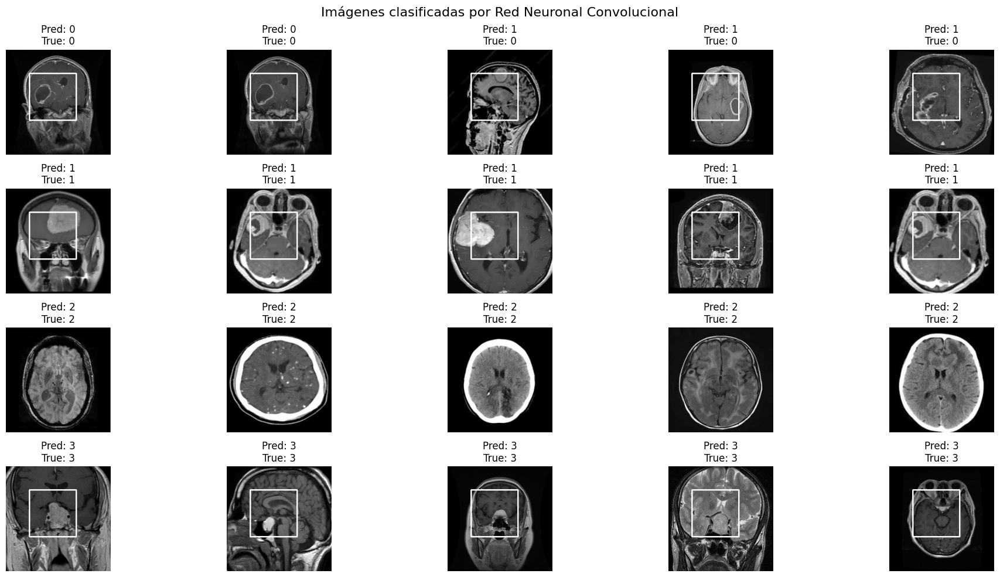

Matriz de Confusión (CNN):
 [[ 31  53   1  15]
 [  0 113   0   2]
 [  0   0 105   0]
 [  2   4   0  68]]
Reporte de Clasificación (CNN):
                   precision    recall  f1-score   support

    glioma_tumor       0.94      0.31      0.47       100
meningioma_tumor       0.66      0.98      0.79       115
        no_tumor       0.99      1.00      1.00       105
 pituitary_tumor       0.80      0.92      0.86        74

        accuracy                           0.80       394
       macro avg       0.85      0.80      0.78       394
    weighted avg       0.85      0.80      0.78       394



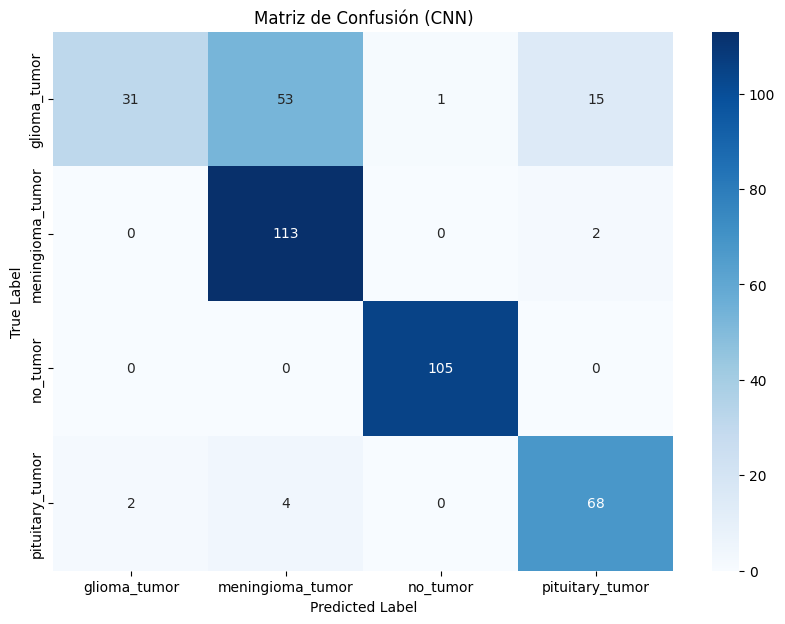

In [ ]:
# Parte 1: Red Neuronal Convolucional (CNN)
cnn_model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(len(le.classes_), activation='softmax')
])

cnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Entrenar el modelo CNN
cnn_model.fit(train_images_expanded, train_labels_encoded, epochs=10, validation_data=(test_images_expanded, test_labels_encoded))

# Evaluar el modelo CNN
cnn_loss, cnn_accuracy = cnn_model.evaluate(test_images_expanded, test_labels_encoded)
print("Accuracy de Red Neuronal Convolucional:", cnn_accuracy)

# Predecir las etiquetas de las imágenes de prueba con CNN
predictions_cnn = cnn_model.predict(test_images_expanded)
predicted_labels_cnn = np.argmax(predictions_cnn, axis=1)

# Mostrar imágenes clasificadas por CNN
mostrar_imagenes_clasificadas(test_images, predicted_labels_cnn, test_labels_encoded, 'Red Neuronal Convolucional')

# Calcular la matriz de confusión CNN
conf_matrix_cnn = confusion_matrix(test_labels_encoded, predicted_labels_cnn)
print("Matriz de Confusión (CNN):\n", conf_matrix_cnn)

# Reporte de clasificación CNN
class_report_cnn = classification_report(test_labels_encoded, predicted_labels_cnn, target_names=le.classes_)
print("Reporte de Clasificación (CNN):\n", class_report_cnn)

# Mostrar matriz de confusión CNN
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_cnn, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Matriz de Confusión (CNN)')
plt.show()



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy de Regresión Logística: 0.7588832487309645


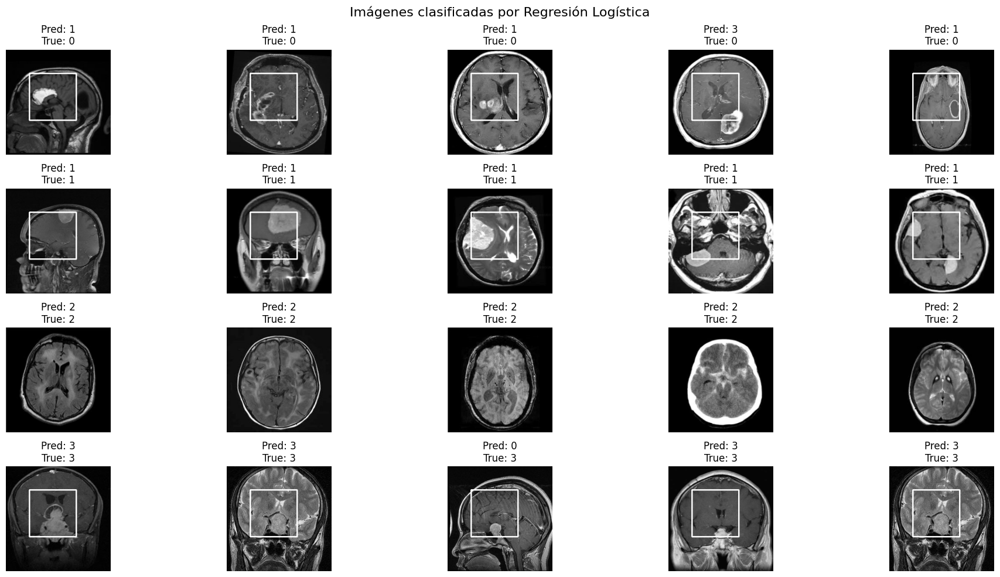

Matriz de Confusión (Regresión Logística):
 [[ 25  56   0  19]
 [  0 114   0   1]
 [  0   0 105   0]
 [  2  17   0  55]]
Reporte de Clasificación (Regresión Logística):
                   precision    recall  f1-score   support

    glioma_tumor       0.93      0.25      0.39       100
meningioma_tumor       0.61      0.99      0.75       115
        no_tumor       1.00      1.00      1.00       105
 pituitary_tumor       0.73      0.74      0.74        74

        accuracy                           0.76       394
       macro avg       0.82      0.75      0.72       394
    weighted avg       0.82      0.76      0.73       394



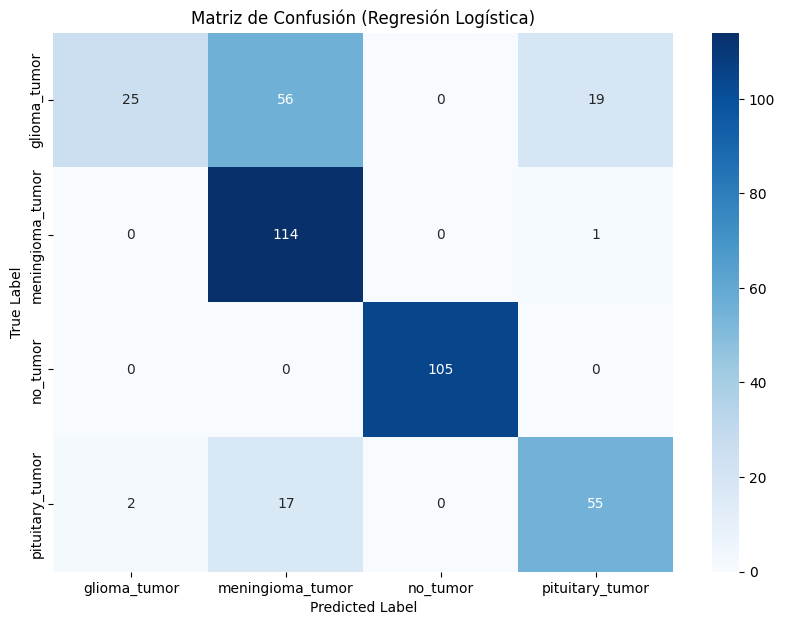

In [ ]:
# Parte 2: Regresión Logística
# Preparar datos para regresión logística (aplanar imágenes)
X_train_flat = train_images.reshape(train_images.shape[0], -1)
X_test_flat = test_images.reshape(test_images.shape[0], -1)

# Crear y entrenar el modelo de regresión logística One-vs-Rest
logistic_model = LogisticRegression(max_iter=1000, multi_class='ovr')
logistic_model.fit(X_train_flat, train_labels_encoded)

# Evaluar el modelo de regresión logística
accuracy_rl = logistic_model.score(X_test_flat, test_labels_encoded)
print("Accuracy de Regresión Logística:", accuracy_rl)

# Predecir las etiquetas de las imágenes de prueba con Regresión Logística
predicciones_rl = logistic_model.predict(X_test_flat)

# Mostrar imágenes clasificadas por Regresión Logística
mostrar_imagenes_clasificadas(test_images, predicciones_rl, test_labels_encoded, 'Regresión Logística')

# Calcular la matriz de confusión Regresión Logística
conf_matrix_rl = confusion_matrix(test_labels_encoded, predicciones_rl)
print("Matriz de Confusión (Regresión Logística):\n", conf_matrix_rl)

# Reporte de clasificación Regresión Logística
class_report_rl = classification_report(test_labels_encoded, predicciones_rl, target_names=le.classes_)
print("Reporte de Clasificación (Regresión Logística):\n", class_report_rl)

# Mostrar matriz de confusión Regresión Logística
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_rl, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Matriz de Confusión (Regresión Logística)')
plt.show()



Accuracy de Árbol de Decisión: 0.7360406091370558


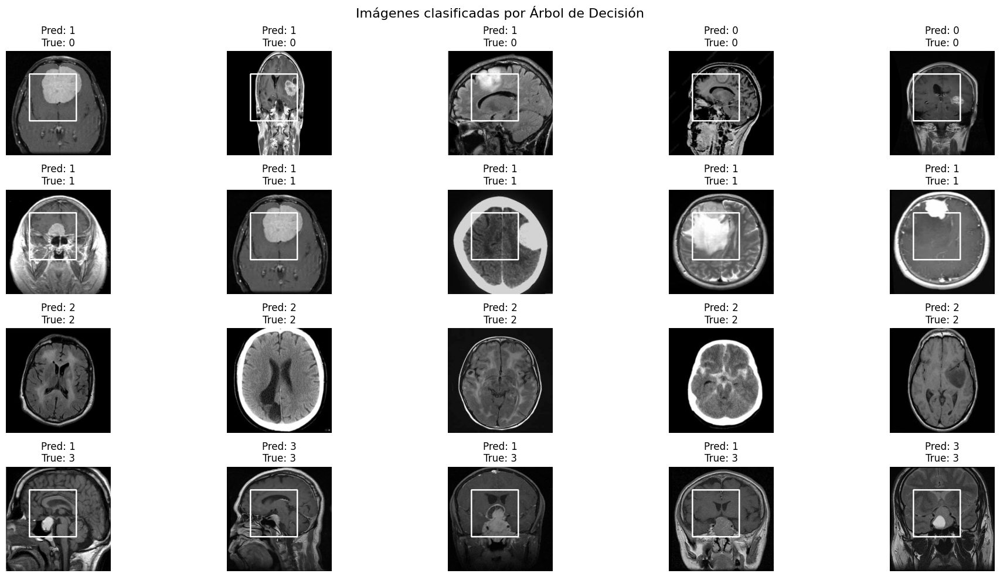

Matriz de Confusión (Árbol de Decisión):
 [[ 24  64   0  12]
 [  0 115   0   0]
 [  0   0 105   0]
 [  0  28   0  46]]
Reporte de Clasificación (Árbol de Decisión):
                   precision    recall  f1-score   support

    glioma_tumor       1.00      0.24      0.39       100
meningioma_tumor       0.56      1.00      0.71       115
        no_tumor       1.00      1.00      1.00       105
 pituitary_tumor       0.79      0.62      0.70        74

        accuracy                           0.74       394
       macro avg       0.84      0.72      0.70       394
    weighted avg       0.83      0.74      0.70       394



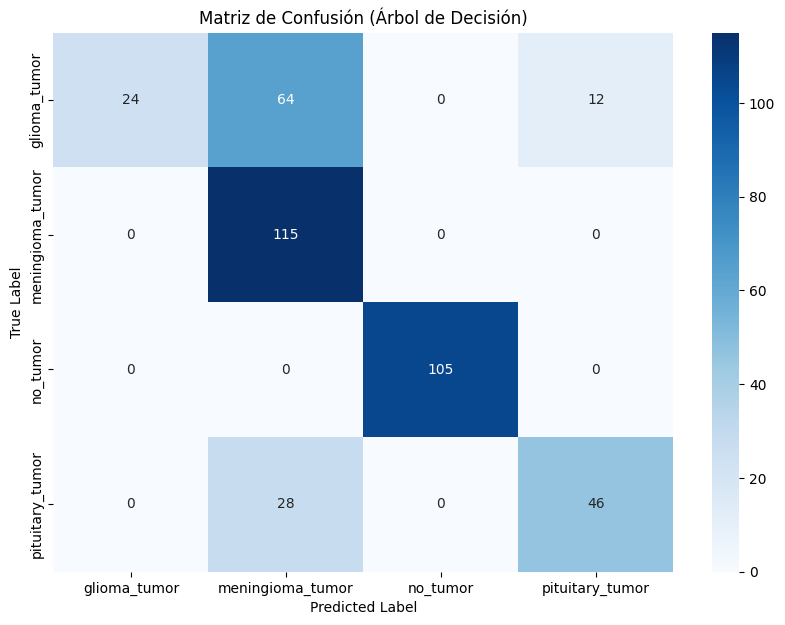

La visualización del árbol de decisión se ha guardado en: output/decision_tree.png


In [ ]:
# Parte 3: Árbol de Decisión
# Crear y entrenar el modelo de árbol de decisión
decision_tree_model = DecisionTreeClassifier()
decision_tree_model.fit(X_train_flat, train_labels_encoded)

# Evaluar el modelo de árbol de decisión
accuracy_dt = decision_tree_model.score(X_test_flat, test_labels_encoded)
print("Accuracy de Árbol de Decisión:", accuracy_dt)

# Predecir las etiquetas de las imágenes de prueba con Árbol de Decisión
predicciones_dt = decision_tree_model.predict(X_test_flat)

# Mostrar imágenes clasificadas por Árbol de Decisión
mostrar_imagenes_clasificadas(test_images, predicciones_dt, test_labels_encoded, 'Árbol de Decisión')

# Calcular la matriz de confusión Árbol de Decisión
conf_matrix_dt = confusion_matrix(test_labels_encoded, predicciones_dt)
print("Matriz de Confusión (Árbol de Decisión):\n", conf_matrix_dt)

# Reporte de clasificación Árbol de Decisión
class_report_dt = classification_report(test_labels_encoded, predicciones_dt, target_names=le.classes_)
print("Reporte de Clasificación (Árbol de Decisión):\n", class_report_dt)

# Mostrar matriz de confusión Árbol de Decisión
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_dt, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Matriz de Confusión (Árbol de Decisión)')
plt.show()

# Crear el directorio 'output' si no existe
output_dir = 'output'
os.makedirs(output_dir, exist_ok=True)

# Ajustar parámetros de la visualización del árbol de decisión
fig, ax = plt.subplots(figsize=(250, 150))  # Tamaño ajustado
plot_tree(decision_tree_model, feature_names=None, class_names=le.classes_, filled=True, rounded=True, fontsize=12, ax=ax)
plt.title('Árbol de Decisión')
output_path = os.path.join(output_dir, 'decision_tree.png')
plt.savefig(output_path, bbox_inches='tight')  # Guardar la imagen sin cortar los bordes
plt.show()

print(f'La visualización del árbol de decisión se ha guardado en: {output_path}')